In [1]:
from ripser import ripser
from persim import plot_diagrams
from numpy import sin,cos, dot
import numpy as np
from numpy import pi,cos,sin
import matplotlib.pyplot as plt
import random
import math

In [2]:
def graph_continuous(image_function, x, y, x_random = True, n_samples= 100000, y_random = True):
    
    if x_random == True:
        X = list(2 * x * np.random.random(n_samples) - x) 
        if y_random == True:
            Y = list(2 * y * np.random.random(n_samples) - y) 
        else:
            Y = np.linspace(-y,y,n_samples)      

    if x_random == False:
        X = np.linspace(-x,x,n_samples)
        if y_random == True:
            Y = list(2 * y * np.random.random(n_samples) - y) 
        else:
            Y = np.linspace(-y,y,n_samples)   

    x_points = []
    y_points = []
    colors = []
    for i in range(n_samples):
        color = image_function(X[i],Y[i]) 
        colors.append(color)
        x_points.append(X[i])
        y_points.append(Y[i])

        
    fig = plt.figure(figsize = (7, 7))
    ax = plt.axes()
    ax.scatter(x_points, y_points, c = colors, s = .1)
    plt.show()

def graph_OneInput(image_function, x, x_random = True, n_samples= 100000, y_random = True):
    
    if x_random == True:
        X = list(2 * x * np.random.random(n_samples) - x)     

    else:
        X = np.linspace(-x,x,n_samples)
        
    x_points = []
    y_points =[]
    colors = []
    for i in range(n_samples):
        x_points.append(X[i])
        y_points.append(image_function(X[i]))

    fig = plt.figure(figsize = (7, 7))
    ax = plt.axes()
    ax.scatter(x_points, y_points, s = .1)
    plt.show()
    
def graph_TwoInput(image_function, x, y, x_random = True, n_samples= 100000, y_random = True):
    
    if x_random == True:
        X = list(2 * x * np.random.random(n_samples) - x) 
        if y_random == True:
            Y = list(2 * y * np.random.random(n_samples) - y) 
        else:
            Y = np.linspace(-y,y,n_samples)      

    if x_random == False:
        X = np.linspace(-x,x,n_samples)
        if y_random == True:
            Y = list(2 * y * np.random.random(n_samples) - y) 
        else:
            Y = np.linspace(-y,y,n_samples)   

    x_points = []
    y_points = []
    colors = []
    for i in range(n_samples):
        color = image_function(X[i],Y[i]) 
        colors.append(color)
        x_points.append(X[i])
        y_points.append(Y[i])

        
    fig = plt.figure(figsize = (7, 7))
    ax = plt.axes()
    ax.scatter(x_points, y_points, c = colors, s = .1)
    plt.show()
    
    


In [3]:
def angelica(x):
    if 0 <= x%4 <= 2:
        f = x%4
    elif 2< x%4 <= 3:
        f = 2
    else:
        f = -2 * (x%4) + 8
    return f

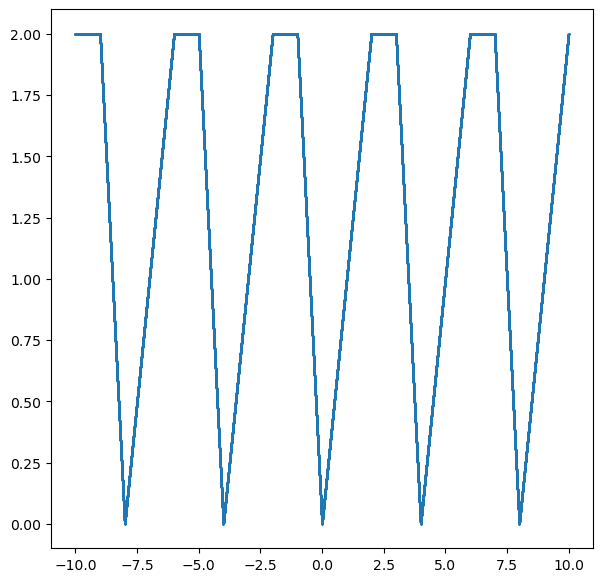

In [4]:
graph_OneInput(angelica, 10,10)

In [5]:
def angelica2(x):
    if 0 <= x%6 <= 0.5:
        f = 6 * (x%6)
    elif 0.5< x%6 <= 2:
        f = 3
    else:
        f = -(3/4) * (x%6) + 4.5
    return f

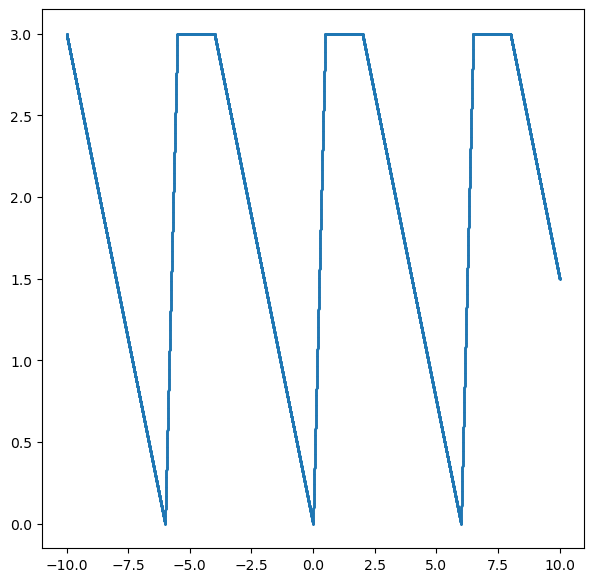

In [6]:
graph_OneInput(angelica2, 10,10)

In [244]:
def mult12(x,y):
    return angelica(x) * angelica2(y)

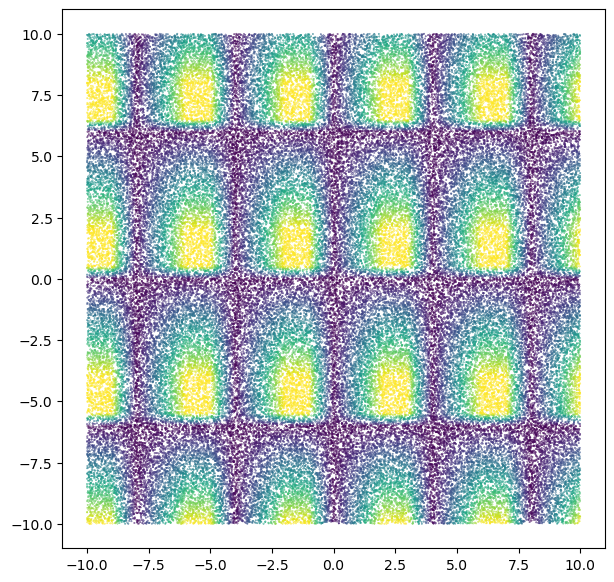

In [245]:
graph_TwoInput(mult12, 10,10)

In [3]:
def view_window_continuous(image_function, num_pixels, window_size):
    
    pixels = get_pixels(num_pixels, window_size)
            
    x_points = []
    y_points = []
    colors = []
    for i in range(len(pixels)):
        color = image_function(pixels[i][0],pixels[i][1]) 
        colors.append(color)
        x_points.append(pixels[i][0])
        y_points.append(pixels[i][1])
    
    fig = plt.figure(figsize = (7, 7))
    ax = plt.axes()
    ax.scatter(x_points, y_points, c = colors)
    plt.show()

def get_pixels(num_pixels, window_size):
    sample = list(np.linspace(-window_size/2, window_size/2, num_pixels))
    pixels = []
    for i in range(len(sample)):
        for j in range(len(sample)):
            pixels.append((sample[i],sample[j]))     
    return pixels


def get_colors(pixels, image_function):
    colors = []
    for pixel in pixels:
        colors.append(image_function(pixel[0],pixel[1]))
    return colors  

def translation(a,b):
    def t_ab(x,y): 
        return x+a, y+b
    return t_ab

def rotation(theta):
    def r_theta(x,y):
        return x * cos(theta) - y * sin(theta), x * sin(theta) + y * cos(theta)
    return r_theta

def isom(a,b,theta):
    def iso(x,y):
        r = rotation(theta)
        t = translation(a,b)
        return t(r(x,y)[0], r(x,y)[1])
    return iso

def generate_isom(n_isos, x_translate, y_translate):
    a = list(2 * x_translate * np.random.random(n_isos) - x_translate) # sampling from (-x,x)
    b = list(2 * y_translate * np.random.random(n_isos) - y_translate) # sampling from (-y,y)
    theta = list(2 * pi * np.random.random(n_isos)) # sampling from (0, 2pi)

    isos = []
    isos_inv = []
    for i in range(n_isos):
        isos.append(isom(a[i], b[i], theta[i]))
        isos_inv.append(isom(-1 * a[i],-1 * b[i],2 * pi - theta[i])) 
    return isos_inv

def new_colors(pixels, iso_inv, image_function):
    pixels_inv = []
    for pixel in pixels: 
        pixels_inv.append(iso_inv(pixel[0], pixel[1]))
    new_colors = get_colors(pixels_inv, image_function)
    return new_colors

def matrix_of_images(pixels, isos_inv, image_function):
    vectors = []
    for i in isos_inv:
        vectors.append([new_colors(pixels, i, image_function)])
    M = np.concatenate(vectors, axis=0 )
    return M

def p_hom(M, maxdim, coeff):
    output = ripser(M, maxdim = maxdim, coeff = coeff)
    return output
    
def persistent_H1_intervals(output):
    H1 = output['dgms'][1].tolist() # all intervals in H1
    d = []
    for pair in H1: 
        d.append(pair[1] - pair[0]) # finding lengths of intervals in H1
    d.sort(reverse = True) # sorting from longest to shortest intervals
    d
    return d

def plot_dgms(output):
    dgms = output['dgms']
    fig = plt.figure(figsize = (12, 6))
    plot_diagrams(dgms)
    
def pipeline(image_function, num_pixels, window_size, n_isos, x_translate, y_translate, maxdim, coeff):
    pixels = get_pixels(num_pixels, window_size)
    isos_inv = generate_isom(n_isos, x_translate, y_translate)
    M = matrix_of_images(pixels, isos_inv, image_function)
    output = p_hom(M, maxdim, coeff)
    return output

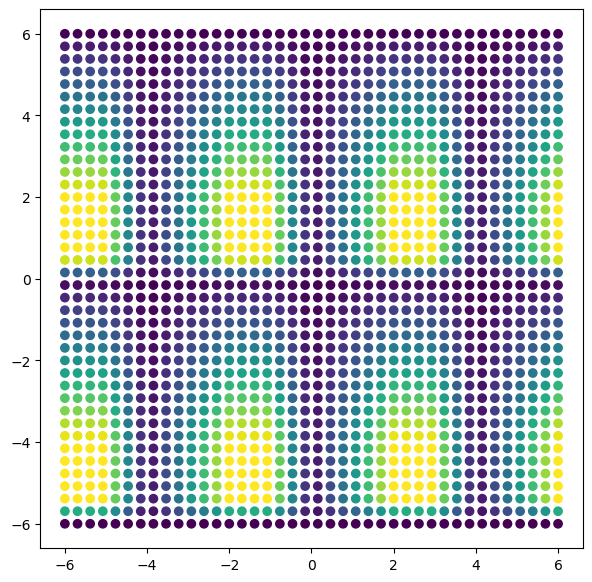

In [247]:
view_window_continuous(mult12,40,12)

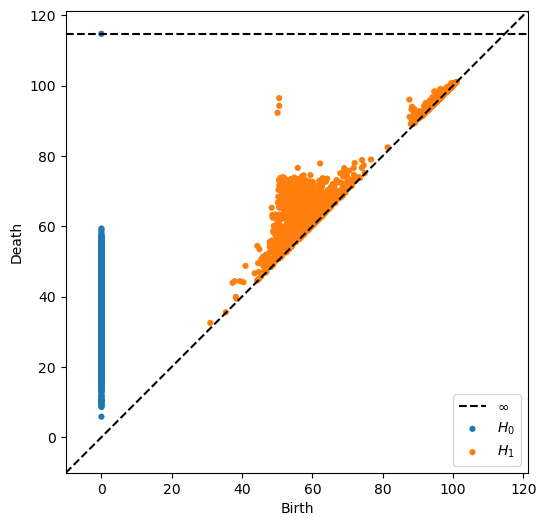

In [248]:
#Z2
output = pipeline(image_function=mult12, num_pixels=40, window_size=12, n_isos=2000, x_translate=100, y_translate=100, maxdim=1, coeff=2)
plot_dgms(output)

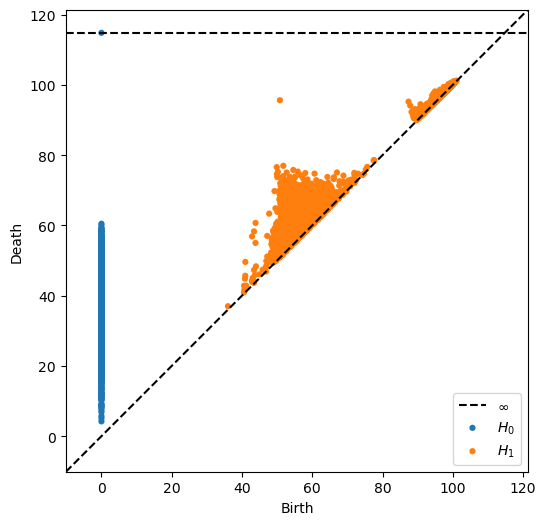

In [125]:
#Z3
output = pipeline(image_function=mult12, num_pixels=40, window_size=12, n_isos=2000, x_translate=100, y_translate=100, maxdim=1, coeff=3)
plot_dgms(output)

In [5]:
def angelica3(x):
    if 0 <= x%12 <= 8:
        f = .25 * (x % 12) + 1
    elif 8 <= x%12 <= 9:
        f = -2 * (x%12) + 18 +1
    else:
        f = 1
    return f

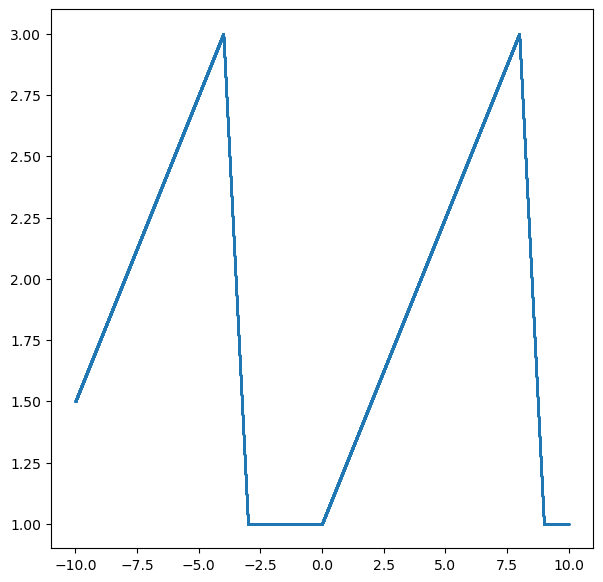

In [6]:
graph_OneInput(angelica3, 10,10)

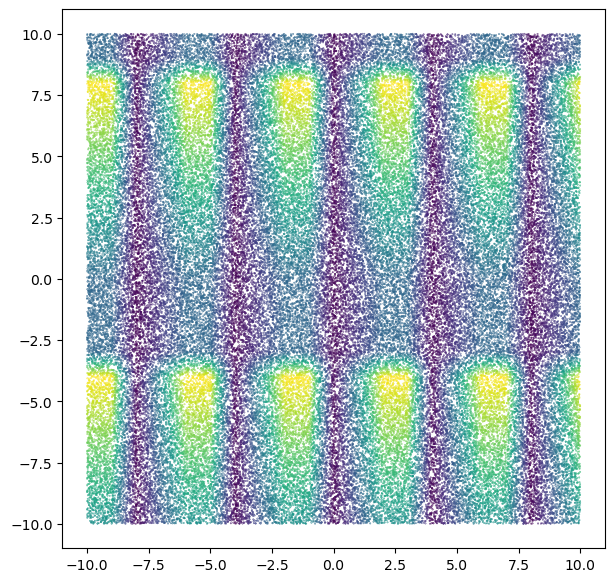

In [8]:
def mult13(x,y):
    return angelica(x) * angelica3(y)
graph_continuous(mult13,10,10)

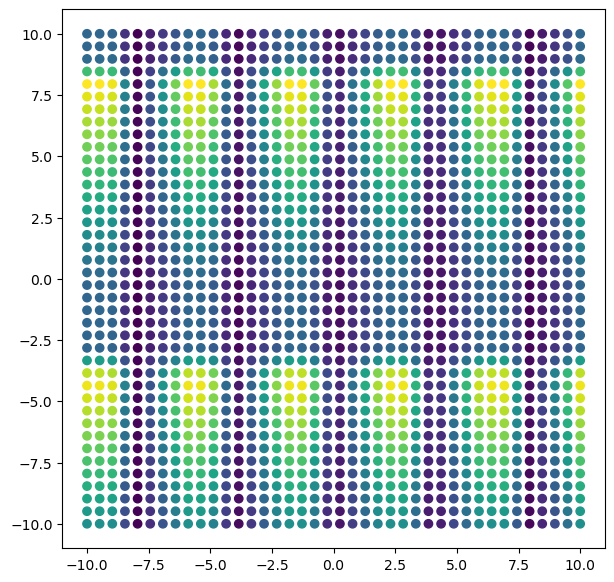

In [151]:
view_window_continuous(mult13,40,20)

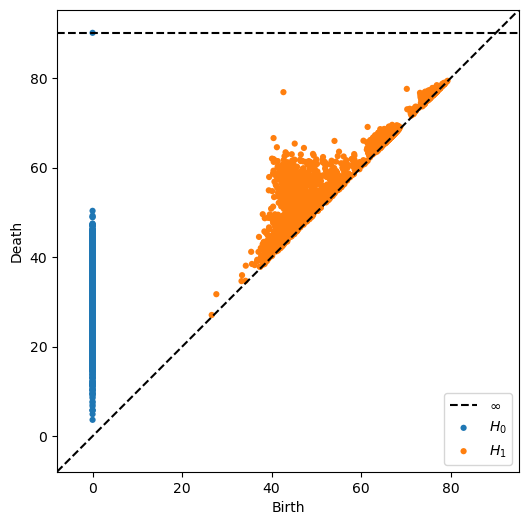

In [154]:
#Z2
output = pipeline(image_function=mult13, num_pixels=40, window_size=20, n_isos=2000, x_translate=100, y_translate=100, maxdim=1, coeff=2)
plot_dgms(output)

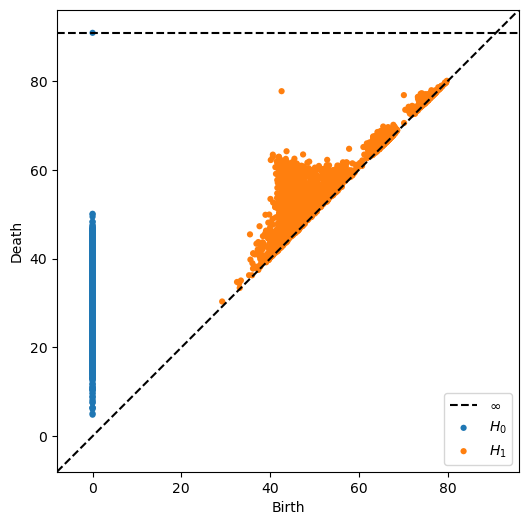

In [153]:
#Z3
output = pipeline(image_function=mult13, num_pixels=40, window_size=20, n_isos=2000, x_translate=100, y_translate=100, maxdim=1, coeff=3)
plot_dgms(output)

In [158]:
def get_pixels_custom(num_pixels, window_size_x, window_size_y, window_center_x, window_center_y):
    sample_x = list(np.linspace(-window_size_x/2, window_size_x/2, num_pixels) + window_center_x)
    sample_y = list(np.linspace(-window_size_y/2, window_size_y/2, num_pixels) + window_center_y)
    pixels = []
    for i in range(len(sample_x)):
        for j in range(len(sample_y)):
            pixels.append((sample_x[i],sample_y[j]))     
    return pixels

In [163]:
def view_window_custom(image_function, num_pixels, window_size_x, window_size_y, window_center_x, window_center_y):
    
    pixels = get_pixels_custom(num_pixels, window_size_x, window_size_y, window_center_x, window_center_y)
            
    x_points = []
    y_points = []
    colors = []
    for i in range(len(pixels)):
        color = image_function(pixels[i][0],pixels[i][1]) 
        colors.append(color)
        x_points.append(pixels[i][0])
        y_points.append(pixels[i][1])
    
    fig = plt.figure(figsize = (7, 7))
    ax = plt.axes()
    ax.scatter(x_points, y_points, c = colors)
    plt.show()

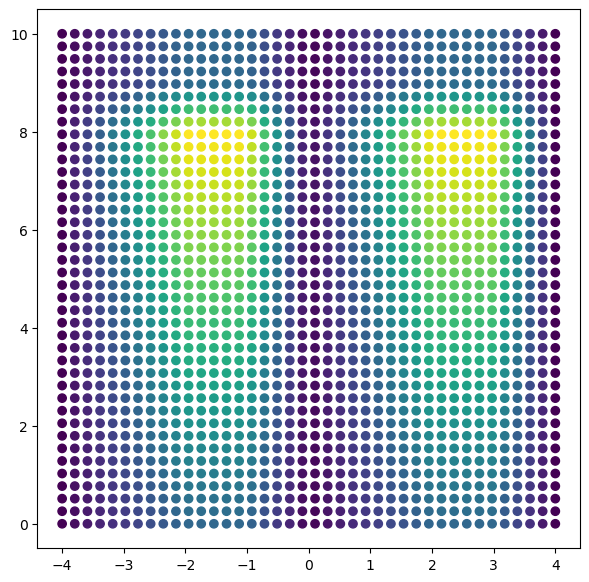

In [165]:
view_window_custom(image_function = mult13, num_pixels = 40, window_size_x = 8, window_size_y = 10, window_center_x = 0, window_center_y = 5)

In [196]:
def p_hom_perm(M, maxdim, coeff, n_perm):
    output = ripser(M, maxdim = maxdim, coeff = coeff, n_perm=n_perm)
    return output

def pipeline_custom(image_function, num_pixels, window_size_x, window_size_y, window_center_x, window_center_y, n_isos, x_translate, y_translate, maxdim, coeff, n_perm):
    pixels = get_pixels_custom(num_pixels, window_size_x, window_size_y, window_center_x, window_center_y)
    isos_inv = generate_isom(n_isos, x_translate, y_translate)
    M = matrix_of_images(pixels, isos_inv, image_function)
    output = p_hom_perm(M, maxdim, coeff, n_perm)
    return output

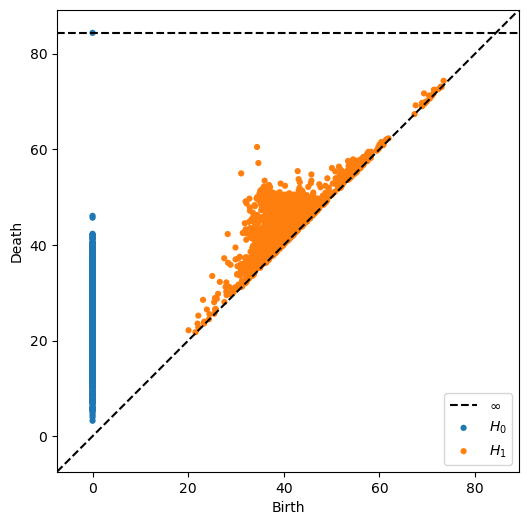

In [168]:
#Z2
output = pipeline_custom(image_function=mult13, num_pixels=40, window_size_x = 8, window_size_y = 10, window_center_x = 0, window_center_y = 5, n_isos=2000, x_translate=100, y_translate=100, maxdim=1, coeff=2)
plot_dgms(output)

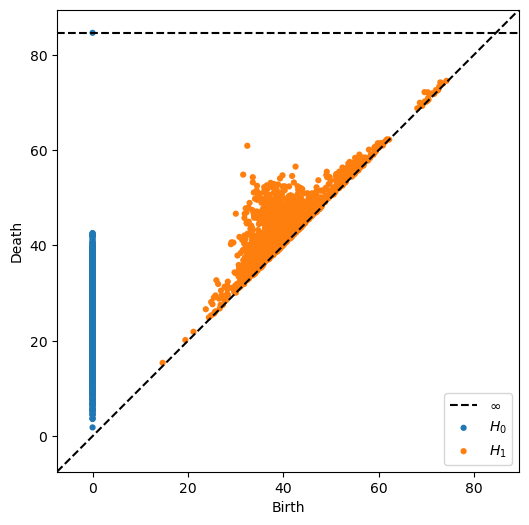

In [169]:
#Z3
output = pipeline_custom(image_function=mult13, num_pixels=40, window_size_x = 8, window_size_y = 10, window_center_x = 0, window_center_y = 5, n_isos=2000, x_translate=100, y_translate=100, maxdim=1, coeff=3)
plot_dgms(output)

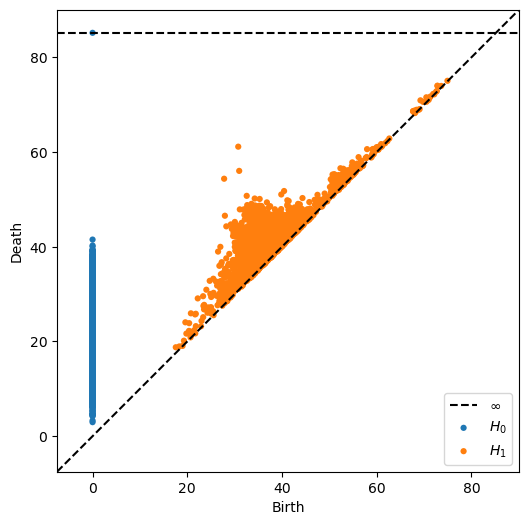

In [170]:
#Z2
output = pipeline_custom(image_function=mult13, num_pixels=40, window_size_x = 8, window_size_y = 10, window_center_x = 0, window_center_y = 5, n_isos=3000, x_translate=100, y_translate=100, maxdim=1, coeff=2)
plot_dgms(output)

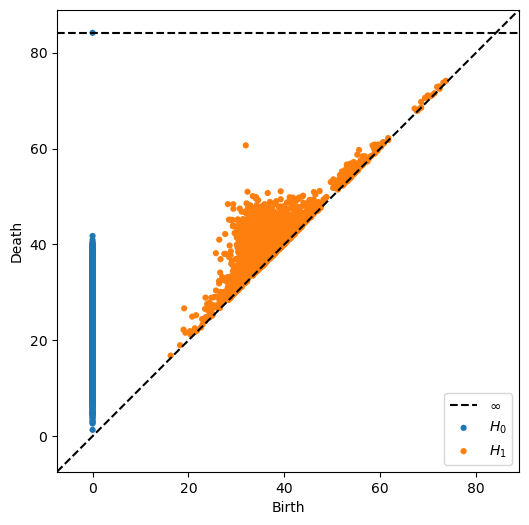

In [171]:
#Z3
output = pipeline_custom(image_function=mult13, num_pixels=40, window_size_x = 8, window_size_y = 10, window_center_x = 0, window_center_y = 5, n_isos=3000, x_translate=100, y_translate=100, maxdim=1, coeff=3)
plot_dgms(output)

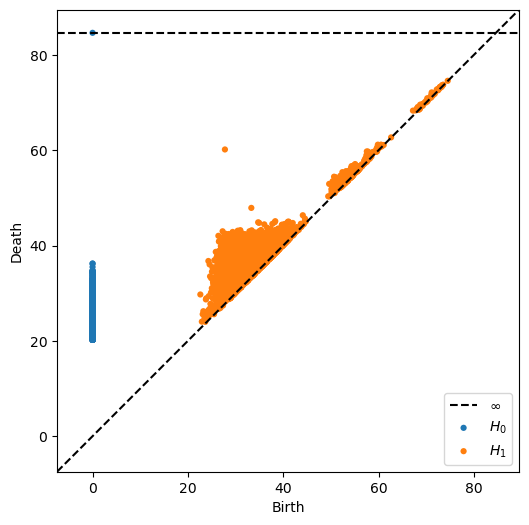

In [179]:
#Z3
output = pipeline_custom(image_function=mult13, num_pixels=40, window_size_x = 8, window_size_y = 10, window_center_x = 0, window_center_y = 5, n_isos=10000, x_translate=100, y_translate=100, maxdim=1, coeff=3, n_perm = 5000)
plot_dgms(output)

**seems to think this is C2**

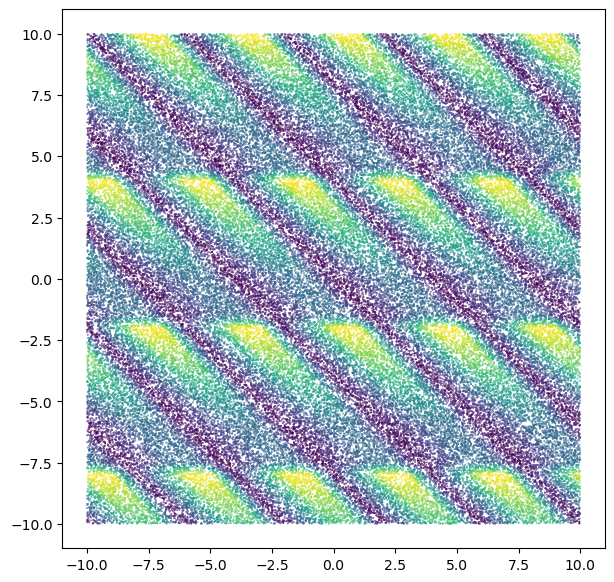

In [9]:
def mult13coef(x,y):
    return angelica(x+y) * angelica3(2*y) 
graph_continuous(mult13coef,10,10)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


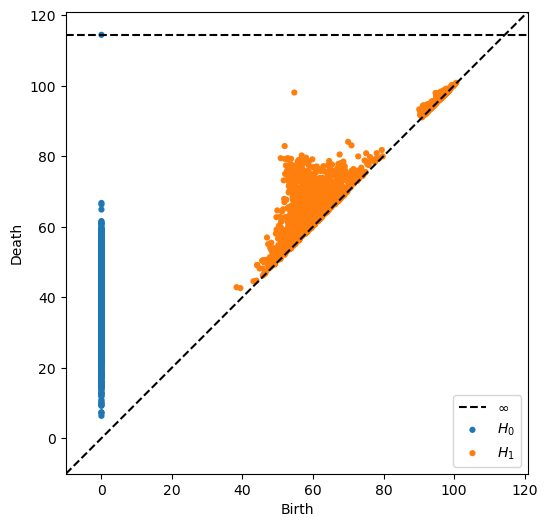

In [211]:
#Z3
output = pipeline(image_function=mult13coef, num_pixels=50, window_size= 15, n_isos=2000, x_translate=100, y_translate=100, maxdim=1, coeff=3)
plot_dgms(output)

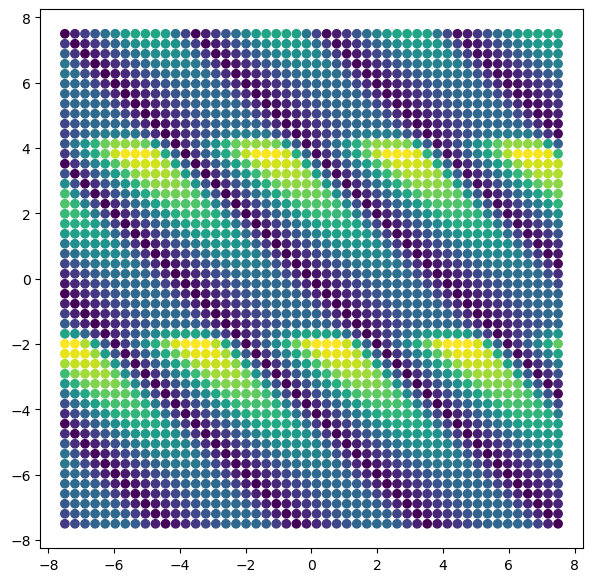

In [200]:
view_window_continuous(mult13coef,50,15)

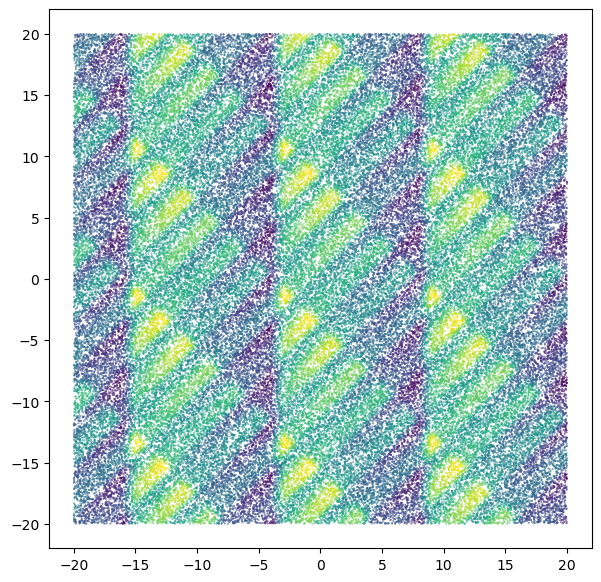

In [10]:
def mult13coef(x,y):
    return angelica(x-y) * angelica3(x+y)- 3*angelica3(x)
graph_continuous(mult13coef,20,20)

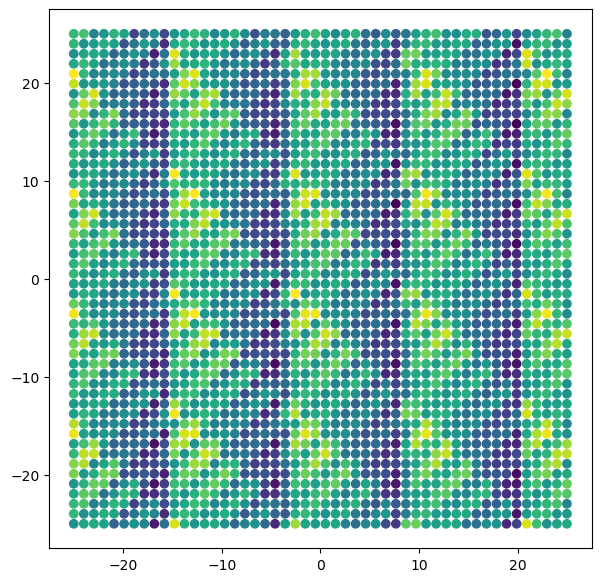

In [11]:
view_window_continuous(image_function=mult13coef, num_pixels=50, window_size=50)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


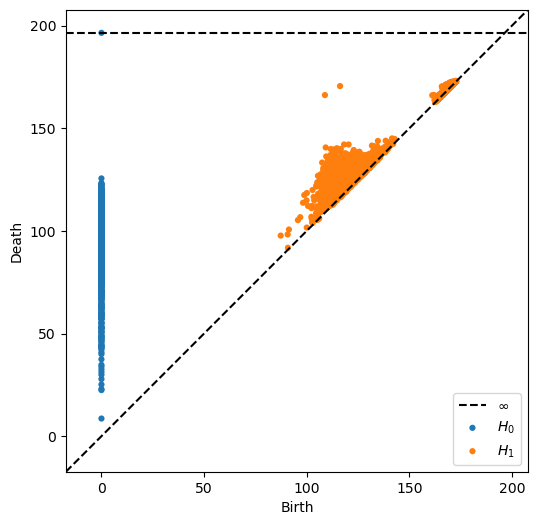

In [251]:
#Z2
output = pipeline(image_function=mult13coef, num_pixels=50, window_size= 50, n_isos=2000, x_translate=1000, y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


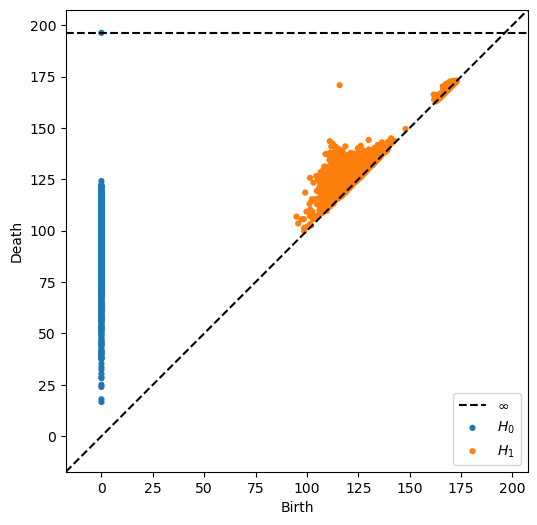

In [252]:
#Z3
output = pipeline(image_function=mult13coef, num_pixels=50, window_size= 50, n_isos=2000, x_translate=1000, y_translate=1000, maxdim=1, coeff=3)
plot_dgms(output)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


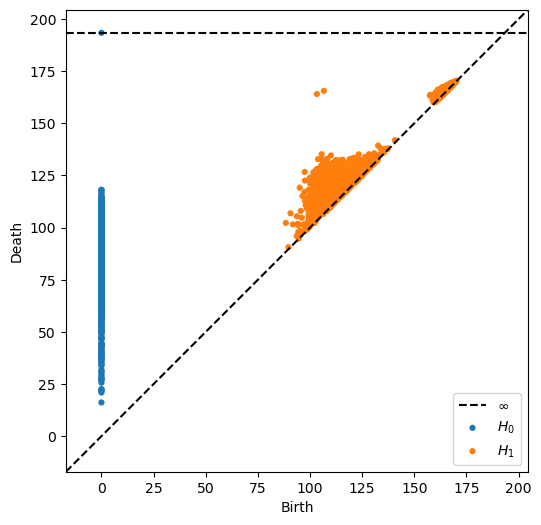

In [237]:
#Z2
output = pipeline(image_function=mult13coef, num_pixels=50, window_size= 30, n_isos=2000, x_translate=1000, y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


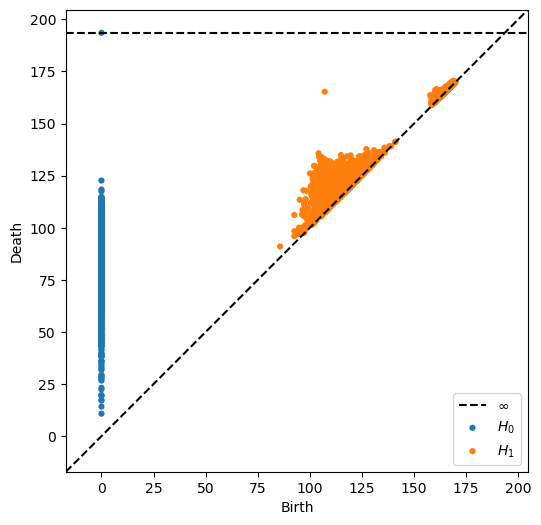

In [236]:
#Z3
output = pipeline(image_function=mult13coef, num_pixels=50, window_size= 30, n_isos=2000, x_translate=1000, y_translate=1000, maxdim=1, coeff=3)
plot_dgms(output)

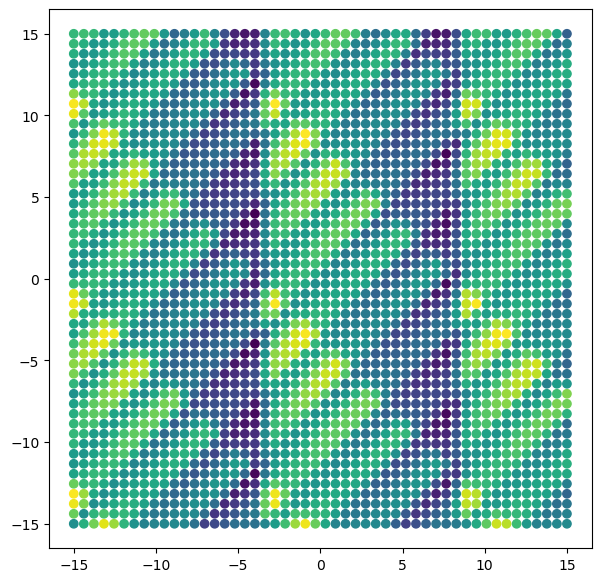

In [235]:
view_window_continuous(mult13coef,50,30)

**it thinks its C4?**

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


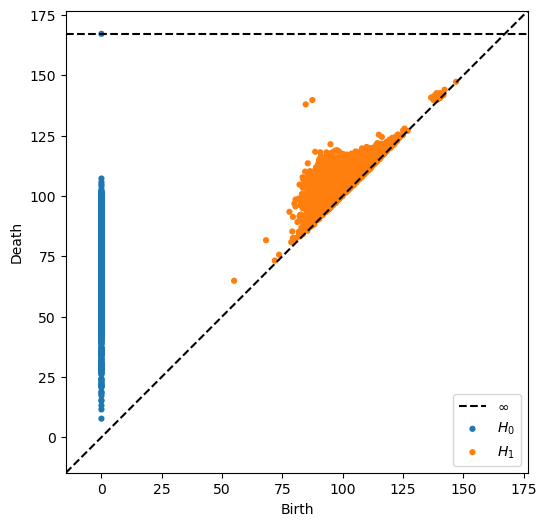

In [253]:
#Z2
output = pipeline(image_function=mult13coef, num_pixels=50, window_size= 10, n_isos=2000, x_translate=1000, y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

In [254]:
persistent_H1_intervals(output)

[53.282684326171875,
 52.317543029785156,
 29.71466064453125,
 28.01172637939453,
 27.389984130859375,
 26.512237548828125,
 25.65583038330078,
 25.357933044433594,
 24.974037170410156,
 24.791419982910156,
 24.726776123046875,
 24.564407348632812,
 24.353797912597656,
 24.225860595703125,
 23.9622802734375,
 23.94554901123047,
 23.879249572753906,
 23.70940399169922,
 23.40483856201172,
 23.401878356933594,
 23.389015197753906,
 23.335357666015625,
 23.111907958984375,
 23.082229614257812,
 23.02948760986328,
 22.971328735351562,
 22.919029235839844,
 22.89665985107422,
 22.887344360351562,
 22.88329315185547,
 22.76513671875,
 22.616912841796875,
 22.589874267578125,
 22.570327758789062,
 22.414215087890625,
 22.35456085205078,
 22.336891174316406,
 22.25908660888672,
 22.23089599609375,
 22.18413543701172,
 22.173667907714844,
 22.16429901123047,
 22.098770141601562,
 21.93719482421875,
 21.884864807128906,
 21.873886108398438,
 21.84880828857422,
 21.844337463378906,
 21.6257400512

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


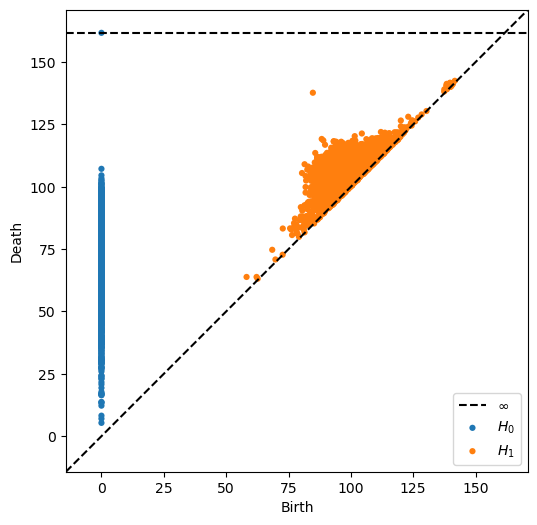

In [257]:
#Z3
output = pipeline(image_function=mult13coef, num_pixels=50, window_size= 10, n_isos=2000, x_translate=1000, y_translate=1000, maxdim=1, coeff=3)
plot_dgms(output)

In [258]:
persistent_H1_intervals(output)

[52.935264587402344,
 30.8499755859375,
 29.60395050048828,
 27.826095581054688,
 27.58434295654297,
 27.18767547607422,
 25.447486877441406,
 25.212364196777344,
 25.140480041503906,
 25.09015655517578,
 24.99645233154297,
 24.799896240234375,
 24.729156494140625,
 24.46038055419922,
 24.344451904296875,
 24.2275390625,
 24.058746337890625,
 23.839599609375,
 23.80573272705078,
 23.624832153320312,
 23.601905822753906,
 23.530296325683594,
 23.15782928466797,
 23.051986694335938,
 22.991416931152344,
 22.976226806640625,
 22.742759704589844,
 22.709152221679688,
 22.591629028320312,
 22.51805877685547,
 22.496238708496094,
 22.491058349609375,
 22.403297424316406,
 22.33405303955078,
 22.286239624023438,
 22.270645141601562,
 22.25775909423828,
 22.213768005371094,
 22.180885314941406,
 22.12250518798828,
 22.065872192382812,
 22.012718200683594,
 21.964706420898438,
 21.913299560546875,
 21.893783569335938,
 21.819732666015625,
 21.8150634765625,
 21.793128967285156,
 21.713256835937

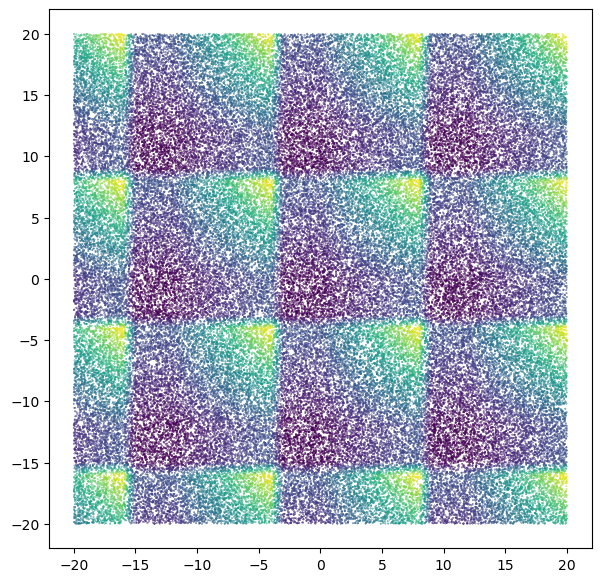

In [12]:
def mult33(x,y):
    return angelica3(x) * angelica3(y)
graph_continuous(mult33,20,20)

In [13]:
#Z2
output = pipeline(image_function=mult33, num_pixels=50, window_size= 50, n_isos=2000, x_translate=1000, y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

KeyboardInterrupt: 

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


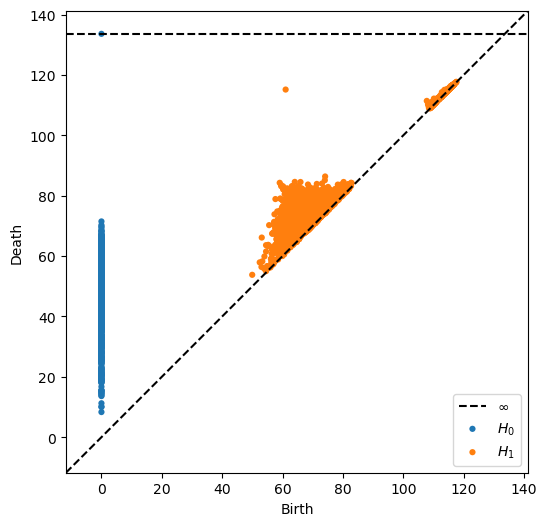

In [263]:
#Z3
output = pipeline(image_function=mult33coef, num_pixels=50, window_size= 50, n_isos=2000, x_translate=1000, y_translate=1000, maxdim=1, coeff=3)
plot_dgms(output)

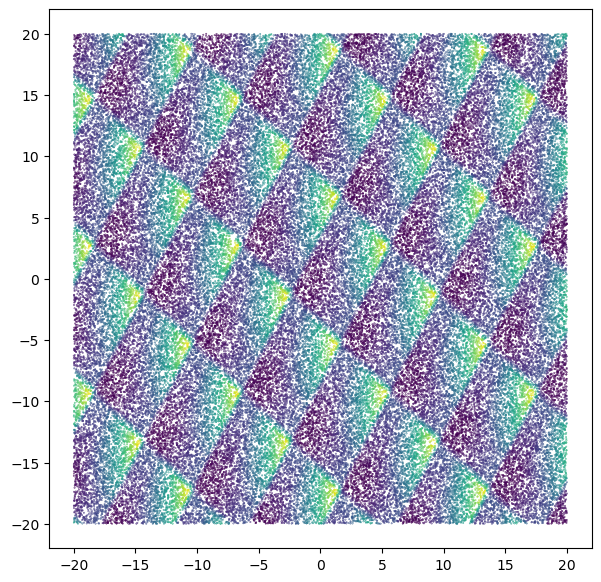

In [7]:
def mult33(x,y):
    return angelica3(x+y) * angelica3(2*x-y)
graph_continuous(mult33,20,20)

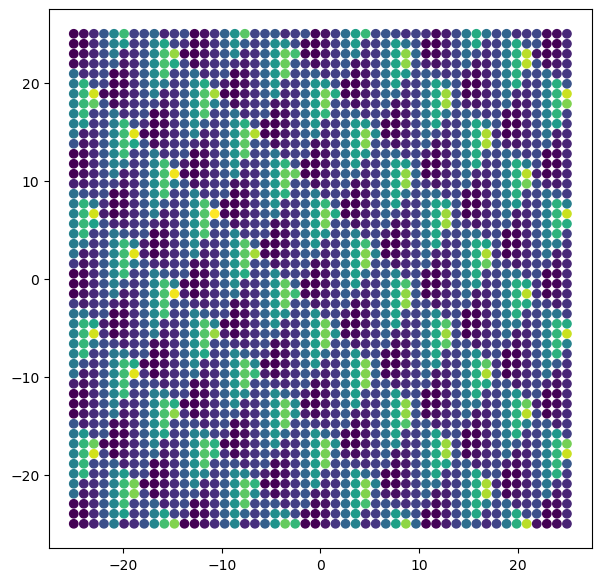

In [8]:
view_window_continuous(mult33, 50, 50)

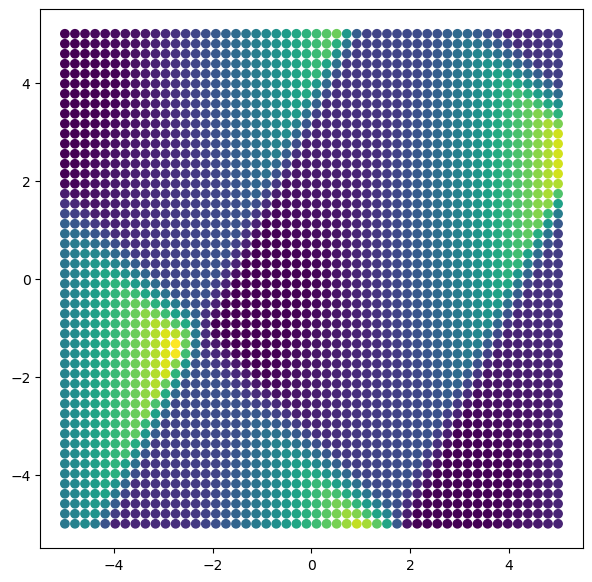

In [9]:
view_window_continuous(mult33, 50, 10)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


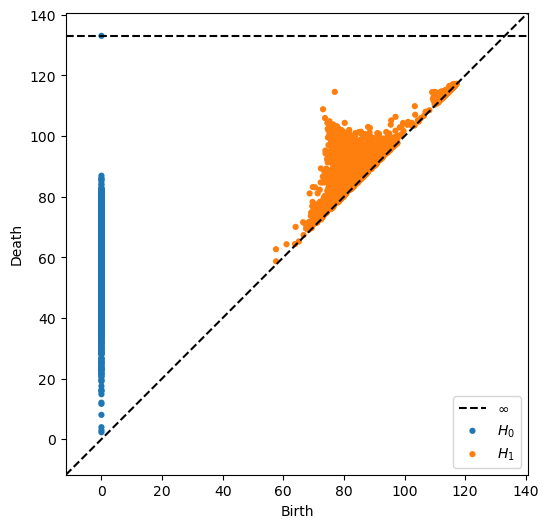

In [42]:
#Z2
output = pipeline(image_function=mult33, num_pixels=50, window_size= 50, n_isos=2000, x_translate=1000, y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

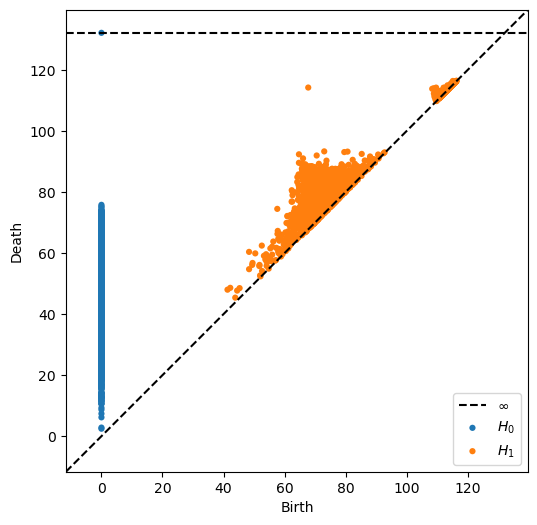

In [43]:
#Z3
output = pipeline(image_function=mult33, num_pixels=50, window_size= 50, n_isos=5000, x_translate=1000, y_translate=1000, maxdim=1, coeff=3)
plot_dgms(output)

/Users/oliviamcgough/opt/anaconda3/lib/python3.9/site-packages/ripser/ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


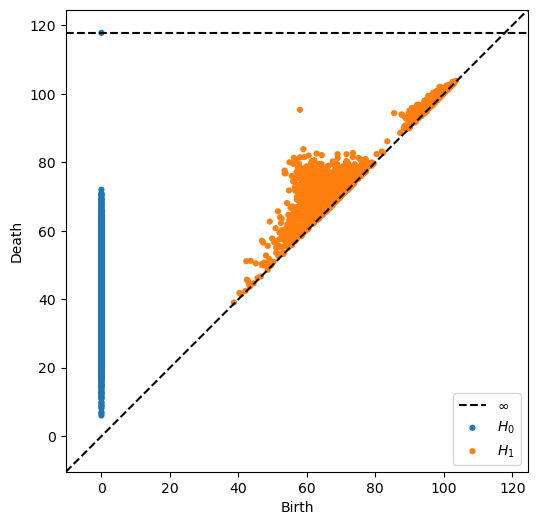

In [44]:
#Z3
output = pipeline(image_function=mult33, num_pixels=50, window_size= 10, n_isos=2000, x_translate=1000, y_translate=1000, maxdim=1, coeff=3)
plot_dgms(output)

**trying dale's idea**

In [27]:
def generate_isom_dale(n_isos, x_translate, y_translate): #random translates
    a = list(2 * x_translate * np.random.random(n_isos//60) - x_translate) 
    b = list(2 * y_translate * np.random.random(n_isos//60) - y_translate) 
    theta = list(2 * pi * np.random.random(n_isos // (n_isos//60)))

    isos = []
    isos_inv = []
    for i in range(len(a)):
        for j in range(len(theta)):
            isos.append(isom(a[i], b[i], theta[j]))
            isos_inv.append(isom(-1 * a[i],-1 * b[i],2 * pi - theta[j])) 
    return isos_inv

In [30]:
def pipeline_dale(image_function, num_pixels, window_size, n_isos, x_translate, y_translate, maxdim, coeff):
    pixels = get_pixels(num_pixels, window_size)
    isos_inv = generate_isom_dale(n_isos, x_translate, y_translate)
    M = matrix_of_images(pixels, isos_inv, image_function)
    output = p_hom(M, maxdim, coeff)
    return output

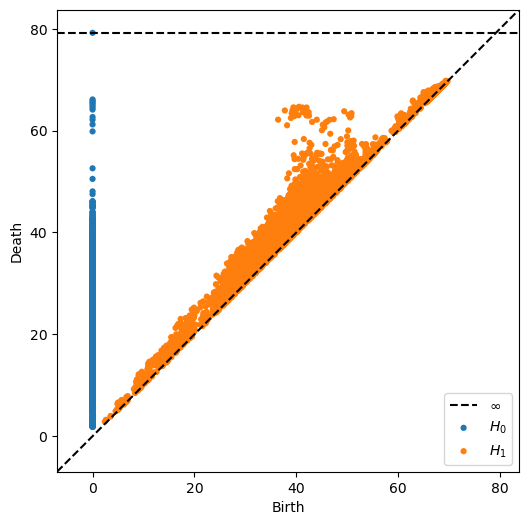

In [34]:
# Z3
output = pipeline_dale(image_function=mult33, num_pixels=30, window_size= 50, n_isos=5000, x_translate=1000, y_translate=1000, maxdim=1, coeff=3)
plot_dgms(output)

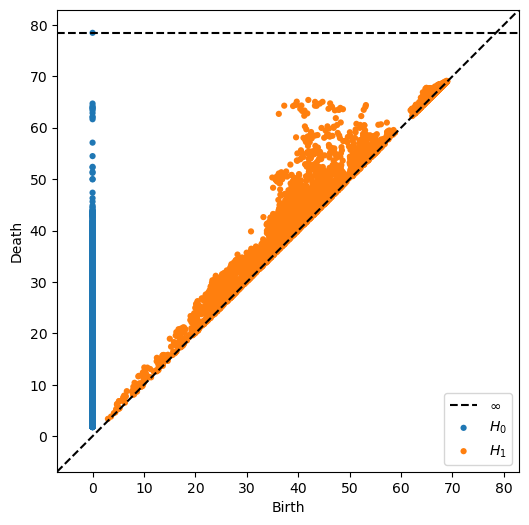

In [35]:
#Z2
output = pipeline_dale(image_function=mult33, num_pixels=30, window_size= 50, n_isos=5000, x_translate=1000, y_translate=1000, maxdim=1, coeff=2)
plot_dgms(output)

**Looking at just translations**

In [1]:
def generate_isom_trans(n_isos, x_translate, y_translate):
    a = list(2 * x_translate * np.random.random(n_isos) - x_translate) # sampling from (-x,x)
    b = list(2 * y_translate * np.random.random(n_isos) - y_translate) # sampling from (-y,y)
    theta = list(np.zeros(2*n_isos)) 

    isos = []
    isos_inv = []
    for i in range(n_isos):
        isos.append(isom(a[i], b[i], theta[i]))
        isos_inv.append(isom(-1 * a[i],-1 * b[i],2 * pi - theta[i])) 
    return isos_inv


def pipeline_trans(image_function, num_pixels, window_size, n_isos, x_translate, y_translate, maxdim, coeff):
    pixels = get_pixels(num_pixels, window_size)
    isos_inv = generate_isom_trans(n_isos, x_translate, y_translate)
    M = matrix_of_images(pixels, isos_inv, image_function)
    output = p_hom(M, maxdim, coeff)
    return output

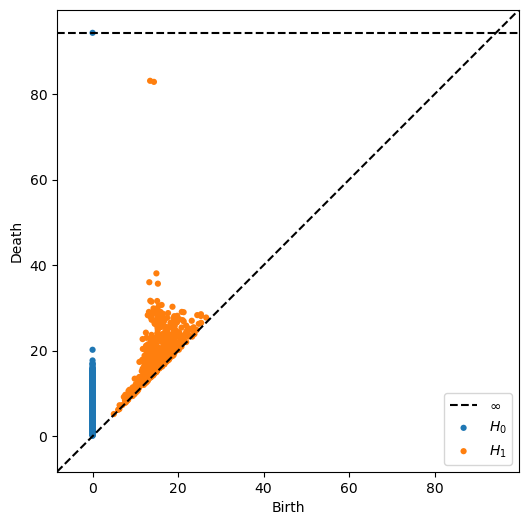

In [9]:
output = pipeline_trans(image_function = mult33, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 100 , y_translate=100, maxdim=1, coeff=2)
plot_dgms(output)

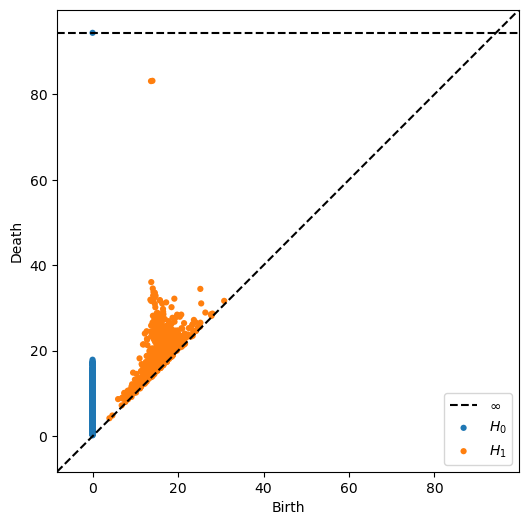

In [11]:
output = pipeline_trans(image_function = mult33, num_pixels = 40 , window_size = 50, n_isos = 2000, x_translate= 100 , y_translate=100, maxdim=1, coeff=3)
plot_dgms(output)

**hook function**

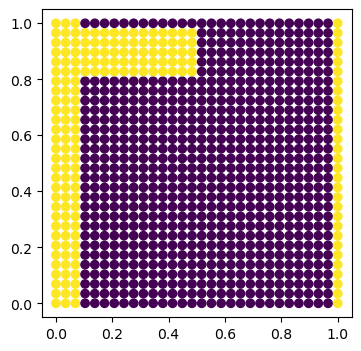

In [52]:
def get_unitsq_pixels(num_pixels, window_size):
    sample = list(np.linspace(0, window_size, num_pixels))
    pixels = []
    for i in range(len(sample)):
        for j in range(len(sample)):
            pixels.append((sample[i],sample[j]))     
    return pixels

    
    
def view_window_continuous_unitsq(image_function, num_pixels, window_size):
    
    pixels = get_unitsq_pixels(num_pixels, window_size)
            
    x_points = []
    y_points = []
    colors = []
    for i in range(len(pixels)):
        color = image_function(pixels[i][0],pixels[i][1]) 
        colors.append(color)
        x_points.append(pixels[i][0])
        y_points.append(pixels[i][1])
    
    fig = plt.figure(figsize = (4, 4))
    ax = plt.axes()
    ax.scatter(x_points, y_points, c = colors)
    plt.show()
    
    
def pipeline_unitsq(image_function, num_pixels, window_size, n_isos, x_translate, y_translate, maxdim, coeff):
    pixels = get_unitsq_pixels(num_pixels, window_size)
    isos_inv = generate_isom(n_isos, x_translate, y_translate)
    M = matrix_of_images(pixels, isos_inv, image_function)
    output = p_hom(M, maxdim, coeff)
    return output

def hook(x,y):
    ret = 0
    if 0<= x % 1 < 0.1:
        ret = 1
    if y % 1 > 0.8 and 0 < x % 1 < 0.5:
        ret = 1
    return ret

view_window_continuous_unitsq(hook, 30,1)

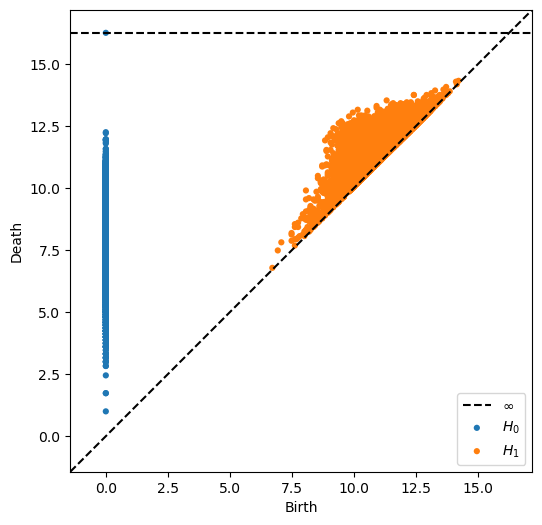

In [48]:
output = pipeline_unitsq(image_function=hook, num_pixels=30, window_size=1, n_isos=5000, x_translate=100, y_translate=100, maxdim=1, coeff=2)
plot_dgms(output)

In [50]:
def pipeline_dale_sq(image_function, num_pixels, window_size, n_isos, x_translate, y_translate, maxdim, coeff):
    pixels = get_unitsq_pixels(num_pixels, window_size)
    isos_inv = generate_isom_dale(n_isos, x_translate, y_translate)
    M = matrix_of_images(pixels, isos_inv, image_function)
    output = p_hom(M, maxdim, coeff)
    return output

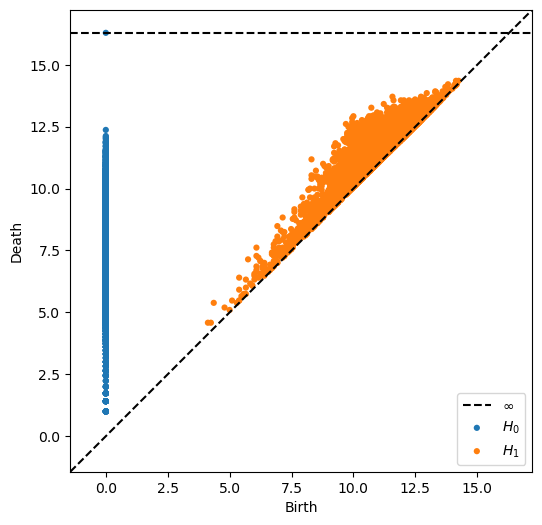

In [53]:
output = pipeline_dale_sq(image_function=hook, num_pixels=30, window_size=1, n_isos=5000, x_translate=10, y_translate=10, maxdim=1, coeff=2)
plot_dgms(output)

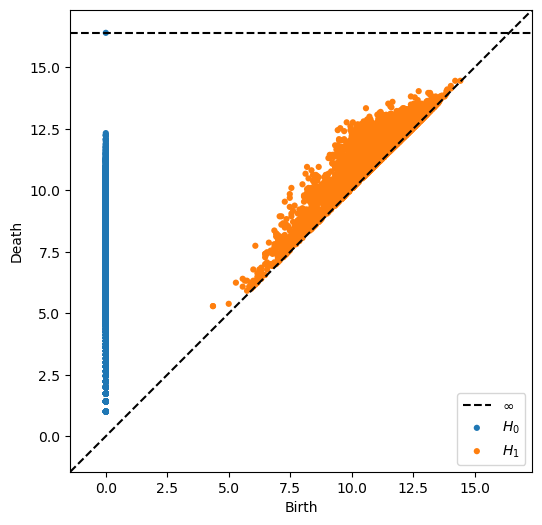

In [54]:
output = pipeline_dale_sq(image_function=hook, num_pixels=30, window_size=1, n_isos=5000, x_translate=10, y_translate=10, maxdim=1, coeff=3)
plot_dgms(output)

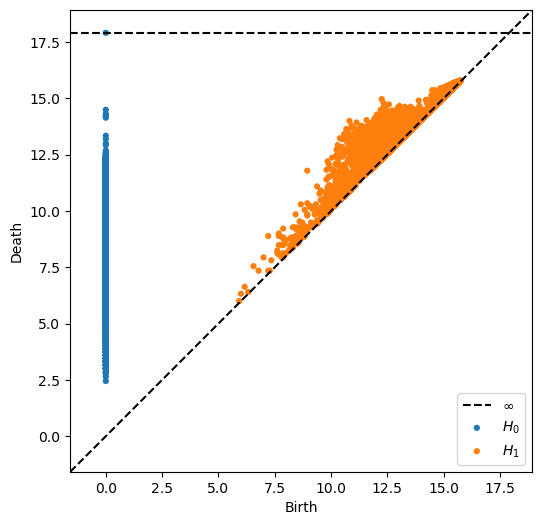

In [55]:
output = pipeline_dale_sq(image_function=hook, num_pixels=30, window_size=5, n_isos=5000, x_translate=10, y_translate=10, maxdim=1, coeff=2)
plot_dgms(output)

In [58]:
from math import dist

def denoise(M, radius):
    NewM = np.zeros((M.shape[0], M.shape[1]))
    for i in range(len(M)):
        neighbors = []
        for j in range(len(M)):
            if dist(M[i],M[j]) < radius:
                neighbors.append(M[j])
        NewM[i] = sum(neighbors)/len(neighbors)
    return NewM

def matrix_pipeline_unitsq(image_function, num_pixels, window_size, n_isos, x_translate, y_translate):
    pixels = get_unitsq_pixels(num_pixels, window_size)
    isos_inv = generate_isom(n_isos, x_translate, y_translate)
    M = matrix_of_images(pixels, isos_inv, image_function)
    return M

In [69]:
M = matrix_pipeline_unitsq(image_function=hook, num_pixels=30, window_size=1, n_isos=2000, x_translate=10, y_translate=10)
NewM = denoise(M, 11)

In [70]:
NewM

array([[0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.2 ],
       [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       ...,
       [0.  , 0.2 , 0.4 , ..., 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , ..., 0.5 , 0.5 , 0.5 ],
       [0.  , 0.  , 0.25, ..., 0.  , 0.  , 0.  ]])

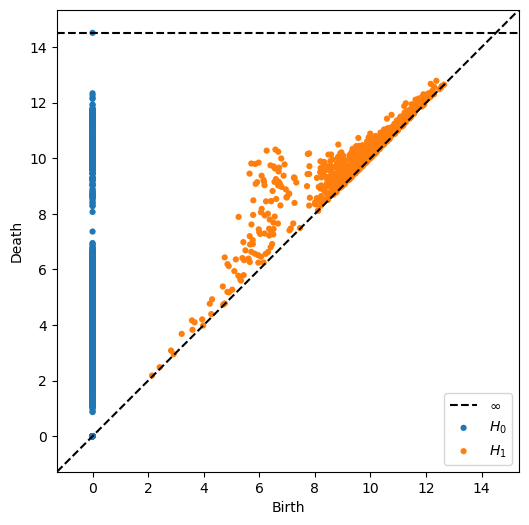

In [71]:
output=p_hom(NewM, maxdim = 1,coeff = 2)
plot_dgms(output)

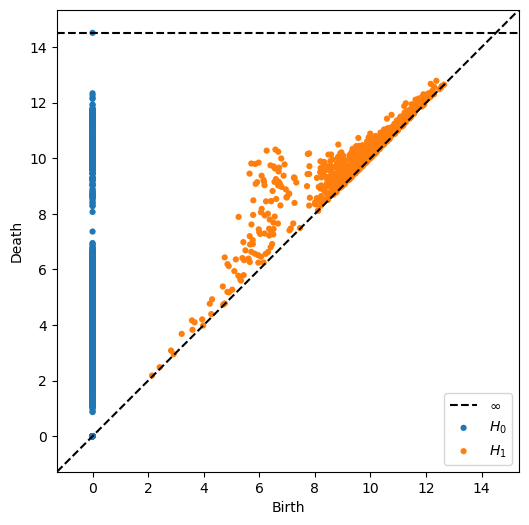

In [72]:
output=p_hom(NewM, maxdim = 1,coeff = 3)
plot_dgms(output)

In [73]:
M = matrix_pipeline_unitsq(image_function=hook, num_pixels=30, window_size=1, n_isos=3000, x_translate=10, y_translate=10)
NewM = denoise(M, 11)

In [74]:
NewM

array([[0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.   ],
       [0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.   ],
       [0.75 , 1.   , 0.75 , ..., 0.75 , 0.75 , 0.75 ],
       ...,
       [0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.   ],
       [0.5  , 0.5  , 0.5  , ..., 0.5  , 0.5  , 0.5  ],
       [0.125, 0.125, 0.125, ..., 0.   , 0.   , 0.   ]])

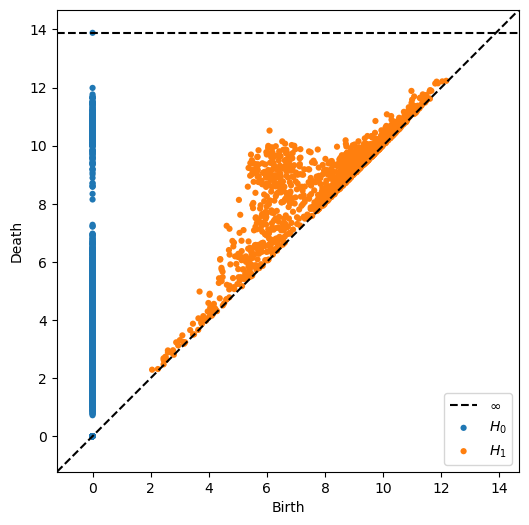

In [75]:
output=p_hom(NewM, maxdim = 1,coeff = 3)
plot_dgms(output)

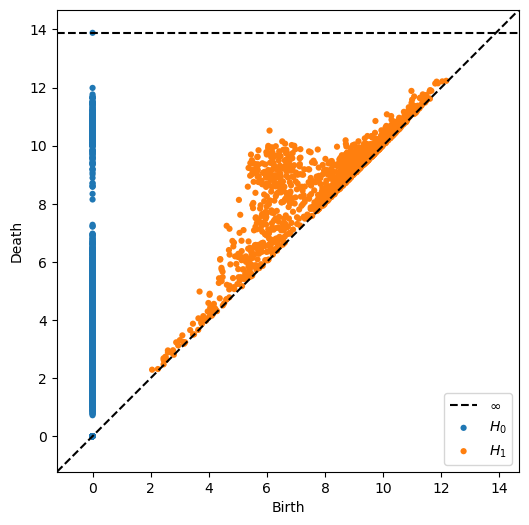

In [76]:
output=p_hom(NewM, maxdim = 1,coeff = 2)
plot_dgms(output)

In [77]:
M = matrix_pipeline_unitsq(image_function=hook, num_pixels=30, window_size=1, n_isos=4000, x_translate=10, y_translate=10)
NewM = denoise(M, 11)

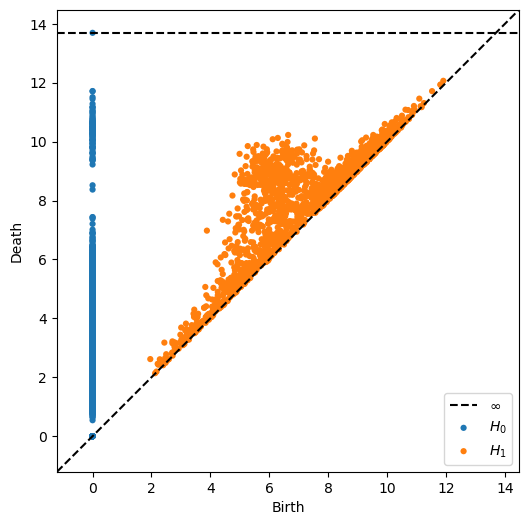

In [78]:
output=p_hom(NewM, maxdim = 1,coeff = 3)
plot_dgms(output)

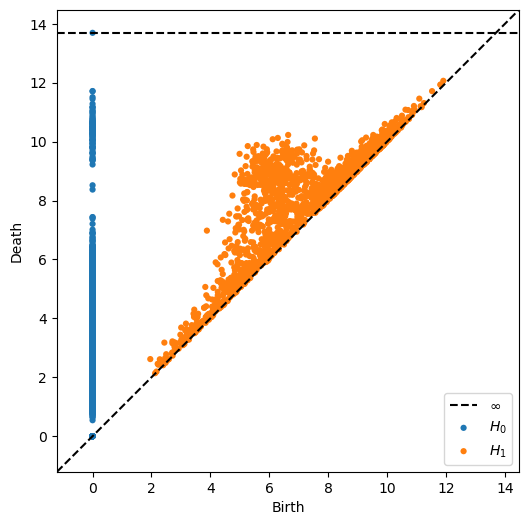

In [79]:
output=p_hom(NewM, maxdim = 1,coeff = 2)
plot_dgms(output)

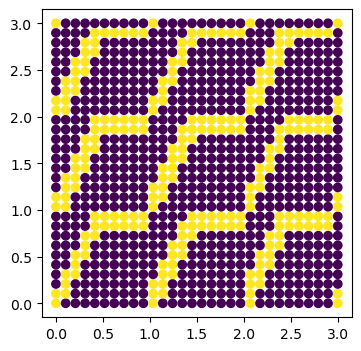

In [85]:
def slant(x,y):
    ret = 0
    if (0 <= x % 1 < 0.5) and (x % 1 - 0.1 <= 0.5* (y % 1) <= x%1 + 0.1):
        ret = 1
    if y % 1 > 0.8 and 0.5 < x % 1 < 1:
        ret = 1
    return ret

view_window_continuous_unitsq(slant, 30,3)

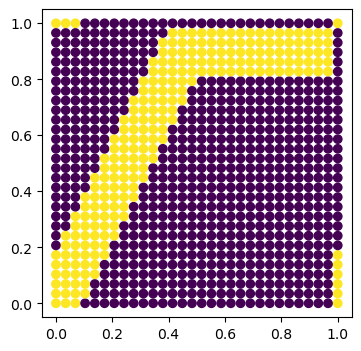

In [86]:
view_window_continuous_unitsq(slant, 30,1)

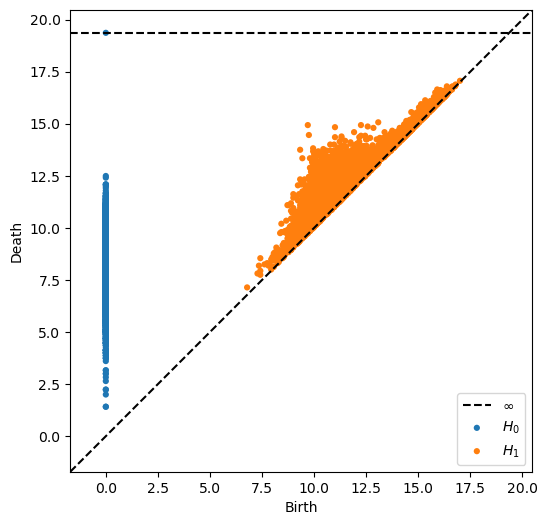

In [97]:
output = pipeline_unitsq(image_function=slant, num_pixels=30, window_size=1, n_isos=5000, x_translate=10, y_translate=10, maxdim=1, coeff=2)
plot_dgms(output)

In [98]:
persistent_H1_intervals(output)

[5.237824440002441,
 4.7100372314453125,
 4.420348167419434,
 3.9076833724975586,
 3.870401382446289,
 3.8323965072631836,
 3.7249202728271484,
 3.601470947265625,
 3.5437049865722656,
 3.4907379150390625,
 3.476755142211914,
 3.4525794982910156,
 3.3527002334594727,
 3.3437423706054688,
 3.341846466064453,
 3.3292617797851562,
 3.3292617797851562,
 3.3166255950927734,
 3.304732322692871,
 3.2573909759521484,
 3.253451347351074,
 3.229670524597168,
 3.1292524337768555,
 3.1283044815063477,
 3.1268224716186523,
 3.086139678955078,
 3.073786735534668,
 3.065816879272461,
 3.061319351196289,
 3.050431251525879,
 3.045548439025879,
 3.0396604537963867,
 3.0396604537963867,
 3.0396604537963867,
 3.035008430480957,
 3.0241031646728516,
 3.00411319732666,
 3.001448631286621,
 2.9729738235473633,
 2.957390785217285,
 2.9550838470458984,
 2.945737838745117,
 2.945737838745117,
 2.9409799575805664,
 2.9388999938964844,
 2.9179697036743164,
 2.917163848876953,
 2.916837692260742,
 2.9116058349609

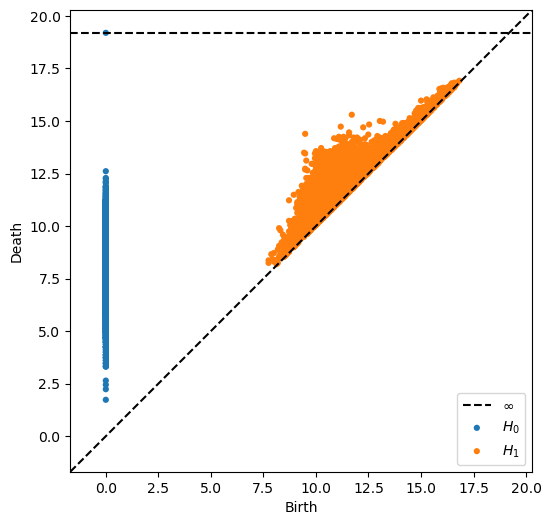

In [99]:
output = pipeline_unitsq(image_function=slant, num_pixels=30, window_size=1, n_isos=5000, x_translate=10, y_translate=10, maxdim=1, coeff=3)
plot_dgms(output)

In [100]:
persistent_H1_intervals(output)

[4.900662422180176,
 4.056756973266602,
 3.9667911529541016,
 3.5923585891723633,
 3.575484275817871,
 3.56466007232666,
 3.5505800247192383,
 3.5037498474121094,
 3.464358329772949,
 3.366532325744629,
 3.329710006713867,
 3.3169031143188477,
 3.314666748046875,
 3.304732322692871,
 3.2788829803466797,
 3.2410898208618164,
 3.2205801010131836,
 3.2066726684570312,
 3.20174503326416,
 3.19277286529541,
 3.183669090270996,
 3.1635217666625977,
 3.1572704315185547,
 3.143625259399414,
 3.1421356201171875,
 3.1126232147216797,
 3.1030712127685547,
 3.0574474334716797,
 3.057183265686035,
 3.0396604537963867,
 3.0268211364746094,
 3.0040550231933594,
 2.9708690643310547,
 2.9659852981567383,
 2.93878173828125,
 2.93878173828125,
 2.934098243713379,
 2.922419548034668,
 2.9179697036743164,
 2.9059953689575195,
 2.9004955291748047,
 2.8909072875976562,
 2.8875818252563477,
 2.8809947967529297,
 2.880753517150879,
 2.8679256439208984,
 2.8679256439208984,
 2.8619766235351562,
 2.8619766235351

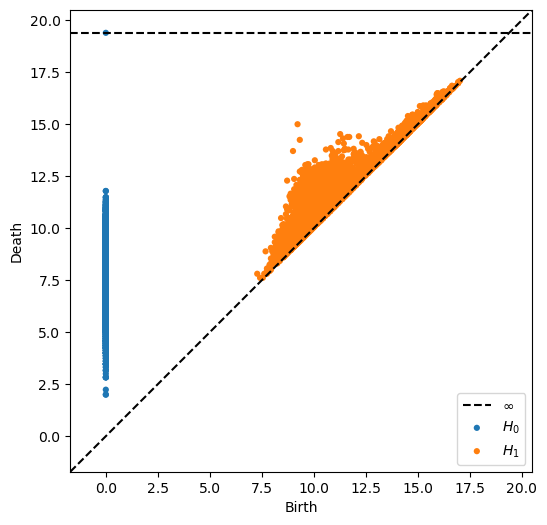

In [101]:
output = pipeline_unitsq(image_function=slant, num_pixels=30, window_size=1, n_isos=7000, x_translate=10, y_translate=10, maxdim=1, coeff=2)
plot_dgms(output)

In [102]:
persistent_H1_intervals(output)

[5.780455589294434,
 4.920427322387695,
 4.711309432983398,
 3.5704078674316406,
 3.4467411041259766,
 3.400543212890625,
 3.381336212158203,
 3.372267723083496,
 3.3331642150878906,
 3.329901695251465,
 3.313931465148926,
 3.3046398162841797,
 3.256411552429199,
 3.254596710205078,
 3.240447998046875,
 3.2166242599487305,
 3.215129852294922,
 3.2010440826416016,
 3.136259078979492,
 3.1234941482543945,
 3.1097183227539062,
 3.098438262939453,
 3.098438262939453,
 3.0842714309692383,
 3.082972526550293,
 3.0717849731445312,
 3.0594539642333984,
 3.047273635864258,
 3.0431318283081055,
 3.0397520065307617,
 3.032562255859375,
 3.001448631286621,
 2.9932174682617188,
 2.990571975708008,
 2.9811277389526367,
 2.9691858291625977,
 2.963067054748535,
 2.9617958068847656,
 2.957390785217285,
 2.950603485107422,
 2.926154136657715,
 2.9178943634033203,
 2.916067123413086,
 2.9141597747802734,
 2.9141597747802734,
 2.9105072021484375,
 2.902316093444824,
 2.8983325958251953,
 2.895359039306640

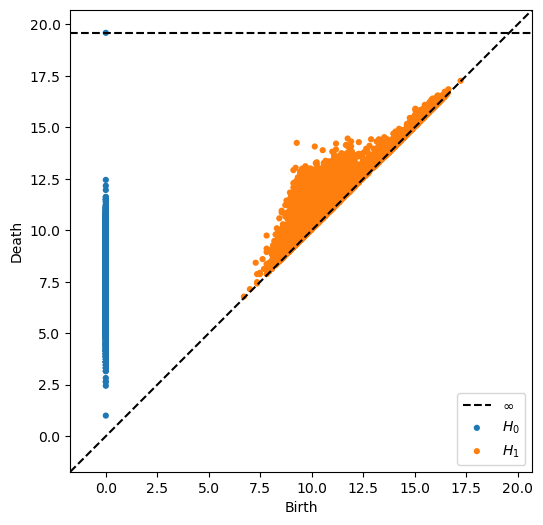

In [103]:
output = pipeline_unitsq(image_function=slant, num_pixels=30, window_size=1, n_isos=7000, x_translate=10, y_translate=10, maxdim=1, coeff=3)
plot_dgms(output)

In [104]:
persistent_H1_intervals(output)

[4.974187850952148,
 3.9223556518554688,
 3.8188600540161133,
 3.8124141693115234,
 3.4606075286865234,
 3.4195165634155273,
 3.411252021789551,
 3.383455276489258,
 3.3567895889282227,
 3.3447065353393555,
 3.3447065353393555,
 3.254596710205078,
 3.2535696029663086,
 3.2424259185791016,
 3.202585220336914,
 3.1889734268188477,
 3.1777725219726562,
 3.1636762619018555,
 3.151142120361328,
 3.1491851806640625,
 3.1373043060302734,
 3.1373043060302734,
 3.136259078979492,
 3.1360549926757812,
 3.1234941482543945,
 3.1097183227539062,
 3.0739898681640625,
 3.068460464477539,
 3.057183265686035,
 3.050126075744629,
 3.0323305130004883,
 3.0031633377075195,
 3.0031633377075195,
 2.990571975708008,
 2.990571975708008,
 2.9729738235473633,
 2.9726123809814453,
 2.945737838745117,
 2.945737838745117,
 2.9439544677734375,
 2.934225082397461,
 2.9141597747802734,
 2.9141597747802734,
 2.9105072021484375,
 2.887887954711914,
 2.866617202758789,
 2.856374740600586,
 2.834848403930664,
 2.83460426

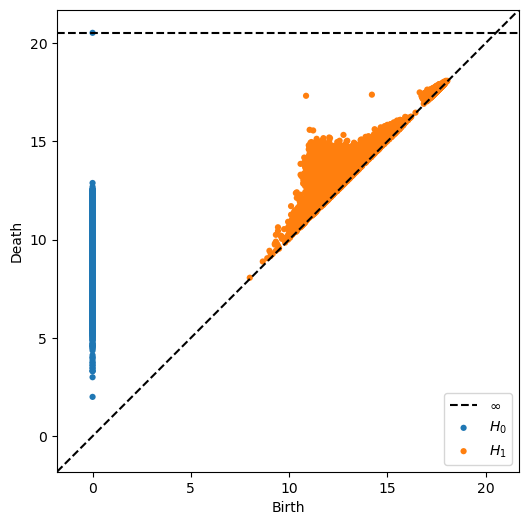

In [91]:
output = pipeline_unitsq(image_function=slant, num_pixels=30, window_size=2, n_isos=5000, x_translate=10, y_translate=10, maxdim=1, coeff=2)
plot_dgms(output)

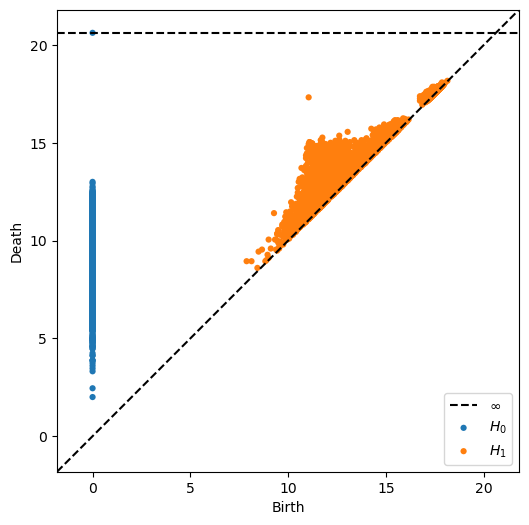

In [92]:
output = pipeline_unitsq(image_function=slant, num_pixels=30, window_size=2, n_isos=5000, x_translate=10, y_translate=10, maxdim=1, coeff=3)
plot_dgms(output)

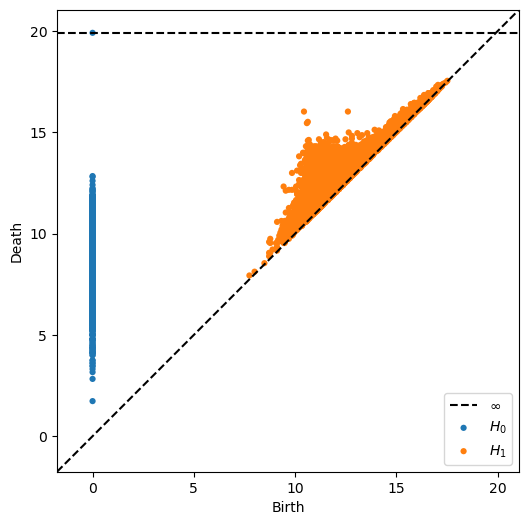

In [93]:
output = pipeline_unitsq(image_function=slant, num_pixels=30, window_size=1.5, n_isos=5000, x_translate=10, y_translate=10, maxdim=1, coeff=2)
plot_dgms(output)

In [94]:
persistent_H1_intervals(output)

[5.590912818908691,
 4.894028663635254,
 4.876620292663574,
 3.9643735885620117,
 3.95166015625,
 3.782167434692383,
 3.745126724243164,
 3.734816551208496,
 3.698399543762207,
 3.6222362518310547,
 3.6076955795288086,
 3.570728302001953,
 3.5355920791625977,
 3.5355920791625977,
 3.5239334106445312,
 3.511911392211914,
 3.5011672973632812,
 3.4825382232666016,
 3.476590156555176,
 3.465057373046875,
 3.43115234375,
 3.43115234375,
 3.4216995239257812,
 3.416995048522949,
 3.4071178436279297,
 3.3960161209106445,
 3.3941688537597656,
 3.3829307556152344,
 3.3718061447143555,
 3.36710262298584,
 3.363369941711426,
 3.336406707763672,
 3.3284053802490234,
 3.3118629455566406,
 3.303957939147949,
 3.2724609375,
 3.265338897705078,
 3.265338897705078,
 3.229670524597168,
 3.215365409851074,
 3.2084665298461914,
 3.2010440826416016,
 3.1876840591430664,
 3.1874046325683594,
 3.1728878021240234,
 3.1728878021240234,
 3.1580591201782227,
 3.1579933166503906,
 3.1550827026367188,
 3.1511421203

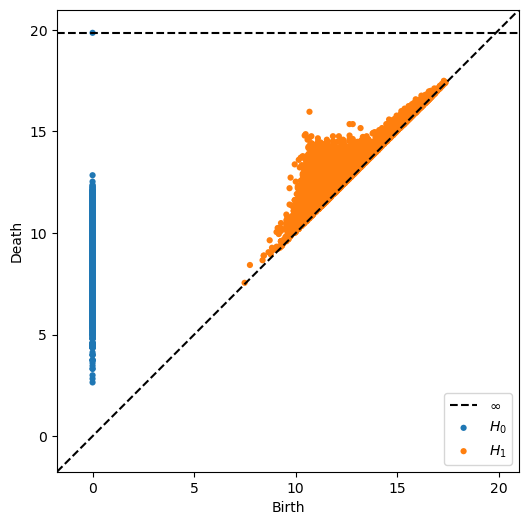

In [95]:
output = pipeline_unitsq(image_function=slant, num_pixels=30, window_size=1.5, n_isos=5000, x_translate=10, y_translate=10, maxdim=1, coeff=3)
plot_dgms(output)

In [96]:
persistent_H1_intervals(output)

[5.2916412353515625,
 4.3779802322387695,
 4.358342170715332,
 4.01986026763916,
 4.011514663696289,
 3.9944934844970703,
 3.663689613342285,
 3.6518754959106445,
 3.6176605224609375,
 3.6171655654907227,
 3.5940160751342773,
 3.5940160751342773,
 3.582524299621582,
 3.5723419189453125,
 3.570840835571289,
 3.5473012924194336,
 3.536046028137207,
 3.464358329772949,
 3.4525794982910156,
 3.439969062805176,
 3.4292144775390625,
 3.4008407592773438,
 3.3741445541381836,
 3.3741445541381836,
 3.3718061447143555,
 3.363369941711426,
 3.363369941711426,
 3.303957939147949,
 3.300917625427246,
 3.2900819778442383,
 3.268734931945801,
 3.2622976303100586,
 3.259638786315918,
 3.2545928955078125,
 3.2483949661254883,
 3.234487533569336,
 3.2318601608276367,
 3.2232208251953125,
 3.2229957580566406,
 3.204583168029785,
 3.198023796081543,
 3.193910598754883,
 3.1876840591430664,
 3.1876840591430664,
 3.162534713745117,
 3.132600784301758,
 3.1283044815063477,
 3.122134208679199,
 3.113382339477